<strong><b><font size="5">Time Series Characterisation</font></b></strong>

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Time-Series" data-toc-modified-id="Time-Series-1"><span class="toc-item-num">
1&nbsp;&nbsp;</span>Time Series</a></span></li><li><span><a href="#Importing-Libraries-for-time-series-forecasting" data-toc-modified-id="Importing-Libraries-for-time-series-forecasting-3"><span class="toc-item-num">
2&nbsp;&nbsp;</span>Importing Libraries for time series forecasting</a></span></li><li><span><a href="#Importing-data" data-toc-modified-id="Importing-data-4"><span class="toc-item-num">
3&nbsp;&nbsp;</span>Importing data</a></span></li><li><span><a href="#Data-Preprocessing-and-Visualization" data-toc-modified-id="Data-Preprocessing-and-Visualization-5"><span class="toc-item-num">4&nbsp;&nbsp;</span>Data Preprocessing and Visualization</a></span><ul class="toc-item"><li><span><a href="#Stationarity" data-toc-modified-id="Stationarity-4.1"><span class="toc-item-num">
4.1&nbsp;&nbsp;</span>Stationarity</a></span><ul class="toc-item"><li><span><a href="#ACF-and-PACF-plots" data-toc-modified-id="ACF-and-PACF-plots-4.1.1"><span class="toc-item-num">4.1.1&nbsp;&nbsp;</span>ACF and PACF plots</a></span></li><li><span><a href="#Plotting-Rolling-Statistics" data-toc-modified-id="Plotting-Rolling-Statistics-4.1.2"><span class="toc-item-num">4.1.2&nbsp;&nbsp;</span>Plotting Rolling Statistics</a></span></li><li><span><a href="#Augmented-Dickey-Fuller-Test" data-toc-modified-id="Augmented-Dickey-Fuller-Test-4.1.3"><span class="toc-item-num">4.1.3&nbsp;&nbsp;</span>Augmented Dickey-Fuller Test</a></span></li></ul></li><li><span><a href="#Making-Time-Series-Stationary" data-toc-modified-id="Making-Time-Series-Stationary-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Making Time Series Stationary</a></span><ul class="toc-item"><li><span><a href="#Transformations" data-toc-modified-id="Transformations-4.2.1"><span class="toc-item-num">4.2.1&nbsp;&nbsp;</span>Transformations</a></span><ul class="toc-item"><li><span><a href="#Log-Scale-Transformation" data-toc-modified-id="Log-Scale-Transformation-4.2.1.1"><span class="toc-item-num">4.2.1.1&nbsp;&nbsp;</span>Log Scale Transformation</a></span></li><li><span><a href="#Other-possible-transformations:" data-toc-modified-id="Other-possible-transformations:-4.2.1.2"><span class="toc-item-num">4.2.1.2&nbsp;&nbsp;</span>Other possible transformations:</a></span></li></ul></li><li><span><a href="#Techniques-to-remove-Trend---Smoothing" data-toc-modified-id="Techniques-to-remove-Trend---Smoothing-5.2.2"><span class="toc-item-num">4.2.2&nbsp;&nbsp;</span>Techniques to remove Trend - Smoothing</a></span><ul class="toc-item"><li><span><a href="#Moving-Average" data-toc-modified-id="Moving-Average-4.2.2.1"><span class="toc-item-num">4.2.2.1&nbsp;&nbsp;</span>Moving Average</a></span></li><li><span><a href="#Exponentially-weighted-moving-average:" data-toc-modified-id="Exponentially-weighted-moving-average:-4.2.2.2"><span class="toc-item-num">4.2.2.2&nbsp;&nbsp;</span>Exponentially weighted moving average:</a></span></li></ul></li><li><span><a href="#Further-Techniques-to-remove-Seasonality-and-Trend" data-toc-modified-id="Further-Techniques-to-remove-Seasonality-and-Trend-4.2.3"><span class="toc-item-num">4.2.3&nbsp;&nbsp;</span>Further Techniques to remove Seasonality and Trend</a></span><ul class="toc-item"><li><span><a href="#Differencing" data-toc-modified-id="Differencing-4.2.3.1"><span class="toc-item-num">4.2.3.1&nbsp;&nbsp;</span>Differencing</a></span></li><li><span><a href="#Decomposition" data-toc-modified-id="Decomposition-4.2.3.2"><span class="toc-item-num">4.2.3.2&nbsp;&nbsp;</span>Decomposition</a>

<div class="alert alert-block alert-info">
<b>DATA SOURCES</b>
    
This project makes use of is a time series of export data from __[The Observatory of Economic Complexity(OEC)](https://atlas.media.mit.edu/static/db/raw/year_origin_sitc_rev2.tsv.bz2)__ based on the  SITC (Standard International Trade Classification)** from 1962 - 2000, with data from __[The Center for International Data](http://cid.econ.ucdavis.edu/)__ from Robert Feenstra. The more recent data 2001 - 2017, is sourced from __[UN COMTRADE](http://comtrade.un.org/)__.

Full **OEC** trade datasets are also available from a data dump on __[SITC Product 4 Digit](https://intl-atlas-downloads.s3.amazonaws.com/country_sitcproduct4digit_year.zip)__
</div>

# Importing Libraries for time series forecasting

In [32]:
import numpy as np
import pandas as pd
pd.set_option('display.expand_frame_repr', False)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

import statsmodels.api as sm
import statsmodels.tsa.stattools as tsa
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.ar_model import AR
from statsmodels.tsa.arima_model import ARMA, ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
import os

from math import sqrt

import matplotlib
import matplotlib.pyplot as plt
matplotlib.colors
matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 12
matplotlib.rcParams['ytick.labelsize'] = 12
matplotlib.rcParams['text.color'] = 'k'
import seaborn as sns

from random import random

from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, median_absolute_error, mean_squared_log_error

import warnings; import os
warnings.filterwarnings("ignore")
plt.style.available
plt.style.use('bmh')
from pylab import rcParams

# Importing data
- Dataset: Trade data:
    - location_id: /- product_id: SITC 4 digit code system
    - year: from 1963 to 2017  - export_value: / - import_value: - / - export_rca:
    - is_new: / - cog: / - distance: / - normalized_distance: / - normalized_cog:
    - normalized_pci: /- export_rpop: / - sitc_eci: / - sitc_coi: / - pci: /- location_code: /- location_name_short_en:
    - sitc_product_code: / - sitc_product_name_short_en: /- Unit: arbitrary

In [121]:
product = 'engine_parts' # Create a dictionary to store product code and sitc code
experiment = 'rca_tests'

def load_data(csv_name,trade_form,target_value, code_system,sitc_code,ts_type):
    '''
    Ingests SITC multi-time series trade data in csv format, filters for one product code, removes zero values for 
    target value, screens target values and renames target columns & creates dataframe for the target columns
    
    Parameters:
    -----------
    csv:
    trade_form:
    target_value:
    code_system:
    sitc_code:
    ts_type:
    '''
    data = pd.read_csv(csv_name)#,header=None
    # TO DO: Create for loop to read sitc code from dictionary
    dframe = data.loc[data[code_system]==sitc_code]
    dframe.rename(columns={'location_name_short_en': 'exporter','export_rca': 'rca'}, inplace=True)
    dframe = dframe[[ts_type,trade_form,target_value]]
    dframe = dframe[dframe[trade_form] != 'Undeclared Countries']
    dframe[target_value].replace('',0, inplace=True)
    #dframe = dframe[dframe[target_value] != 0]
    dframe = dframe[dframe[target_value] >= 0.01]
    return dframe

In [37]:
xdf = load_data('sitc4digit_year.csv','exporter','rca','sitc_product_code',7132,'year')
xdf.columns

Index(['year', 'exporter', 'rca'], dtype='object')

In [207]:
xdf.describe()

,rca
count,4282.000000
mean,0.636428
std,2.854036
min,0.010011
25%,0.024436
50%,0.070735
75%,0.392209
max,114.697680


In [261]:
exporters = xdf['exporter'].unique()

In [179]:
time  = xdf['year'].unique()

In [40]:
print('Shape of the dataframe: {}'.format(xdf.shape)) # Full dataset is 8012 entries
print('Data ranges from {} to {}'.format(xdf.year.min(),xdf.year.max()))
print('The rca values range from {} to {}'.format(xdf.rca.min(),xdf.rca.max()))
print('Countries not declared are {} out of {}'.format(xdf['exporter'].loc[xdf['exporter']=='Undeclared Countries'].count(),xdf.exporter.count()))
print('Zero export values: {}'.format(xdf['rca'][xdf['rca']==0].count()))
print('Null export values: {}'.format(xdf['rca'].isnull().sum()))

Shape of the dataframe: (4282, 3)
Data ranges from 1962 to 2017
The rca values range from 0.010010773 to 114.69768
Countries not declared are 0 out of 4282
Zero export values: 0
Null export values: 0


# Data Preprocessing and Visualization

__Converting to datetime format:__

In [41]:
xdf['year'] = pd.to_datetime(xdf['year'], format='%Y')
xdf.columns

Index(['year', 'exporter', 'rca'], dtype='object')

In [42]:
#xdf = xdf.drop(columns=["rca"])
#xdf.columns

In [285]:
#sns.scatterplot(x='year',y='rca',data=xdf)
#sns.pairplot(xdf)

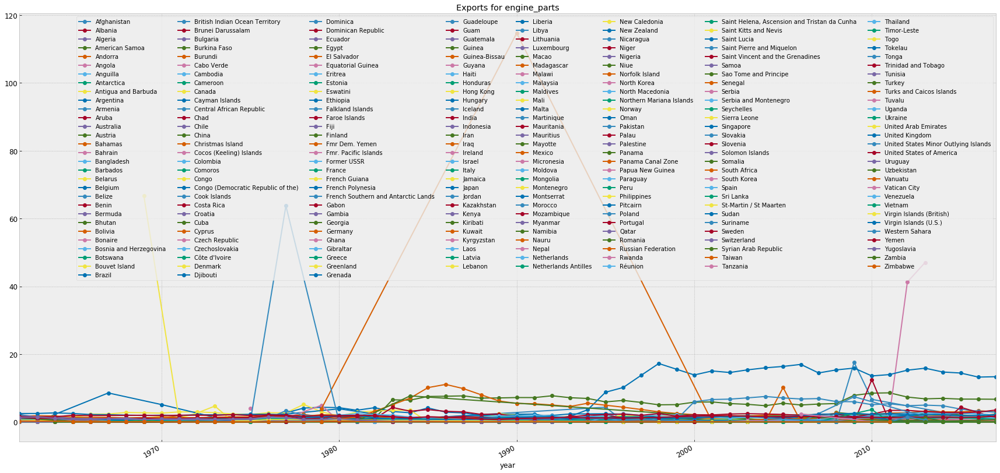

In [128]:
fig, ax = plt.subplots(figsize=(30,15))
for key, grp in xdf.groupby(['exporter']):
        ax = grp.plot(ax=ax, kind='line', x='year', y='rca', label=key, marker='o',title='Exports for {}'.format(product))
        ax.legend(ncol=8, loc='best')
        target = 'images\\{}\\{}'.format(product,experiment)
        savefile = os.path.join(os.getcwd(),target,'Exports for {}'.format(product))
plt.savefig(savefile)

In [45]:
df_grp = xdf.set_index('year')
df_grp.head(2)

,exporter,rca
year,,
2003-01-01,Aruba,0.018273
2010-01-01,Aruba,0.092508


In [294]:
df_grp = xdf.groupby([xdf.year.name, xdf.exporter.name]).mean().unstack()
df_grps = df_grp.apply(pd.to_numeric, errors='coerce').fillna(0, downcast='infer')
df_grps.columns = df_grps.columns.droplevel()
df_grps.head(1)

exporter,Afghanistan,Albania,Algeria,American Samoa,Andorra,Angola,Anguilla,Antarctica,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,Austria,Bahamas,Bahrain,Bangladesh,Barbados,Belarus,Belgium,Belize,Benin,Bermuda,Bhutan,Bolivia,Bonaire,Bosnia and Herzegovina,Botswana,Bouvet Island,Brazil,British Indian Ocean Territory,Brunei Darussalam,Bulgaria,Burkina Faso,Burundi,Cabo Verde,Cambodia,Cameroon,Canada,Cayman Islands,Central African Republic,Chad,Chile,China,Christmas Island,Cocos (Keeling) Islands,Colombia,Comoros,Congo,Congo (Democratic Republic of the),Cook Islands,Costa Rica,Croatia,Cuba,Cyprus,Czech Republic,Czechoslovakia,Côte d'Ivoire,Denmark,Djibouti,Dominica,Dominican Republic,Ecuador,Egypt,El Salvador,Equatorial Guinea,Eritrea,Estonia,Eswatini,Ethiopia,Falkland Islands,Faroe Islands,Fiji,Finland,Fmr Dem. Yemen,Fmr. Pacific Islands,Former USSR,France,French Guiana,French Polynesia,French Southern and Antarctic Lands,Gabon,Gambia,Georgia,Germany,Ghana,Gibraltar,Greece,Greenland,Grenada,Guadeloupe,Guam,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Honduras,Hong Kong,Hungary,Iceland,India,Indonesia,Iran,Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kiribati,Kuwait,Kyrgyzstan,Laos,Latvia,Lebanon,Liberia,Libya,Lithuania,Luxembourg,Macao,Madagascar,Malawi,Malaysia,Maldives,Mali,Malta,Martinique,Mauritania,Mauritius,Mayotte,Mexico,Micronesia,Moldova,Mongolia,Montenegro,Montserrat,Morocco,Mozambique,Myanmar,Namibia,Nauru,Nepal,Netherlands,Netherlands Antilles,New Caledonia,New Zealand,Nicaragua,Niger,Nigeria,Niue,Norfolk Island,North Korea,North Macedonia,Northern Mariana Islands,Norway,Oman,Pakistan,Palau,Palestine,Panama,Panama Canal Zone,Papua New Guinea,Paraguay,Peru,Philippines,Pitcairn,Poland,Portugal,Qatar,Romania,Russian Federation,Rwanda,Réunion,"Saint Helena, Ascension and Tristan da Cunha",Saint Kitts and Nevis,Saint Lucia,Saint Pierre and Miquelon,Saint Vincent and the Grenadines,Samoa,Sao Tome and Principe,Senegal,Serbia,Serbia and Montenegro,Seychelles,Sierra Leone,Singapore,Slovakia,Slovenia,Solomon Islands,Somalia,South Africa,South Korea,Spain,Sri Lanka,St-Martin / St Maarten,Sudan,Suriname,Sweden,Switzerland,Syrian Arab Republic,Taiwan,Tanzania,Thailand,Timor-Leste,Togo,Tokelau,Tonga,Trinidad and Tobago,Tunisia,Turkey,Turks and Caicos Islands,Tuvalu,Uganda,Ukraine,United Arab Emirates,United Kingdom,United States Minor Outlying Islands,United States of America,Uruguay,Uzbekistan,Vanuatu,Vatican City,Venezuela,Vietnam,Virgin Islands (British),Virgin Islands (U.S.),Western Sahara,Yemen,Yugoslavia,Zambia,Zimbabwe
year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1962-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.018789,0.580496,0.14806,0.012963,0.0,0.01253,0.0,0.473824,0.0,0.076695,2.348061,0.0,0.017842,0.0,0.0,0.0,0.0,0.0,0.0,0.197875,0.021476,0.263002,0.014674,0.0,0.020073,0.208462,0.230185,0.0,0.033782,0.0,0.017811,0.0,0.0,0.0,0.0,0.0,0.060467,0.016014,0.0,0.022408,0.0,0.0,0.043419,0.0,1.192845,0.173982,1.848899,0.0,0.0,0.0,0.0,0.023439,0.0,0.0,0.0,0.0,0.0,0.021552,0.0,0.0,0.110766,0.047126,0.290738,0.0,0.127338,0.820721,0.0,0.0,0.0,0.027884,0.062736,0.0,1.674,0.042989,0.0,0.043051,0.0,0.0,0.0,0.0,0.0,0.0,0.028872,0.010109,0.0,0.0,0.148012,0.502856,0.011379,0.14151,0.0,0.0,0.0,0.108328,0.067291,1.321232,0.053677,0.569255,0.068373,0.0,0.014842,0.0,0.0,0.0,0.0,0.0,0.026381,0.01846,0.048717,0.0,0.0,0.0,0.046311,0.0,0.0,0.0,0.0,0.456691,0.0,0.029758,0.0,0.0,0.012943,0.0,0.0,0.0,0.0,0.0,0.0,0.011091,0.0,0.0,0.0,0.602013,0.491603,0.041534,0.0,0.0,0.0,0.036193,0.059694,0.0,0.0,0.0,0.0,0.0,0.554667,0.107453,0.03923,0.0,0.0,0.120572,0.135594,0.0,0.0,0.0,0.022207,0.0,0.0824,0.072541,0.034016,0.011424,0.0,0.0,0.0,0.0,0.0,0.0,2.183242,0.0,0.0,0.0,0.0108,0.0,0.0,0.0,0.07462,0.265236,0.0,0.0,0.0,1.95022

__Setting index as the datetime column for easier manipulations:__

**Image storage**

In [131]:
location = os.getcwd()
target = 'images\\{}\\{}'.format(product,experiment)
path = os.path.join(location, target)

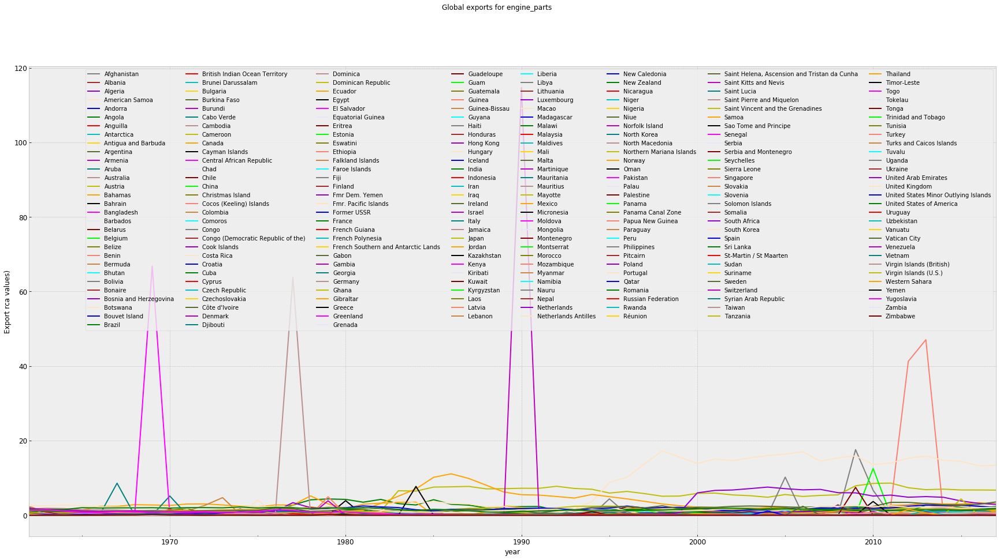

In [298]:
#df_pivoted = xdf.pivot_table(index='year',columns='exporter',values='export_value',aggfunc='sum')
fig1, ax1 = plt.subplots(figsize=(30,15))
#https://matplotlib.org/3.1.0/gallery/color/named_colors.html
colors = ["gray","brown","darkviolet","bisque","b","g","r","c","gold","darkolivegreen","m","teal","rosybrown","y","orange","k","fuchsia","lavender","maroon","lime",
          "olive","salmon","peru","aqua"]
label='global trends in export rca values for engine parts'
df_grps.plot(ax=ax1,label=label,color=colors)
ax1.set_ylabel('Export rca values)')
fig1.suptitle('Global exports for {}'.format(product))

plt.legend(ncol=8,loc='best')

root = os.path.join(path, 'export rca trends')
plt.savefig(str(root))
#.plot(legend=False)#subplots=True, legend=False)

In [235]:
# Adapted from https://stackoverflow.com/questions/30942755/plotting-multiple-time-series-after-a-groupby-in-pandas
# Modified from https://www.programcreek.com/python/example/98021/matplotlib.dates.YearLocator
from matplotlib.dates import YearLocator, MonthLocator, DateFormatter

def plot_multiple_time_series(dframe, ts_label, grp_label, values_label, product,experiment=experiment,figsize=(30,15), title=None):
    '''
    Plots multiple time series on one chart by first grouping time series based on series names from column in dataframe

    Parameters:
    ----------
    dframe : timeseries Pandas dataframe
    ts_label : string
        The name of the df column that has the datetime timestamp x-axis values.
    grp_label : string
        The column name in dframe for groupby method.
    values_label : string
        The column name in dframe for the y-axis.
    figsize : tuple of two integers
        Figure size of the resulting plot, e.g. (20, 7)
    title : string
        Optional title
    '''
    xtick_locator = YearLocator()
    xtick_dateformatter = DateFormatter('%Y')
    fig, ax = plt.subplots(figsize=figsize)
    location = os.getcwd()
    target = 'images\\{}\\{}'.format(product,experiment)
    path = os.path.join(location, target)
    for key, grp in dframe.groupby([grp_label]):
        ax = grp.plot(ax=ax, kind='line', x=ts_label, y=values_label, label=key, marker='o')
    ax.xaxis.set_major_locator(xtick_locator)
    ax.xaxis.set_major_formatter(xtick_dateformatter)
    ax.autoscale_view()
    ax.legend(ncol=5, loc='upper left')
    #_ = plt.xticks(rotation=0, )
    _ = plt.grid()
    _ = plt.xlabel('year')
    _ = plt.ylabel('Export rca value')
    _ = plt.ylim(0, dframe[values_label].max() * 1.25)
    if title is not None:
        _ = plt.title(title)
    savefile = os.path.join(path,label)
    plt.savefig(str(savefile))
    _ = plt.show()

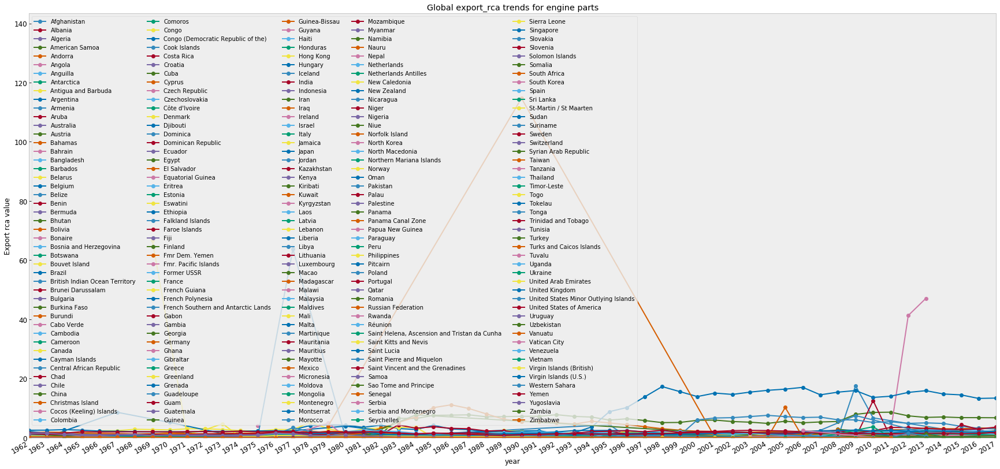

In [236]:
plot_multiple_time_series(xdf, 'year', 'exporter', 'rca', 'engine_parts',experiment,title='Global export_rca trends for engine parts')

__Reviewing plots of the density of observations can provide further insight into the structure of the data:__
- Is the distribution perfectly Gaussian (normal distribution)?
- Skewness: which direction is distribution?
- If not Gaussian and skew, transformations will be necessary prior to modelling

ValueError: num must be 1 <= num <= 1, not 2

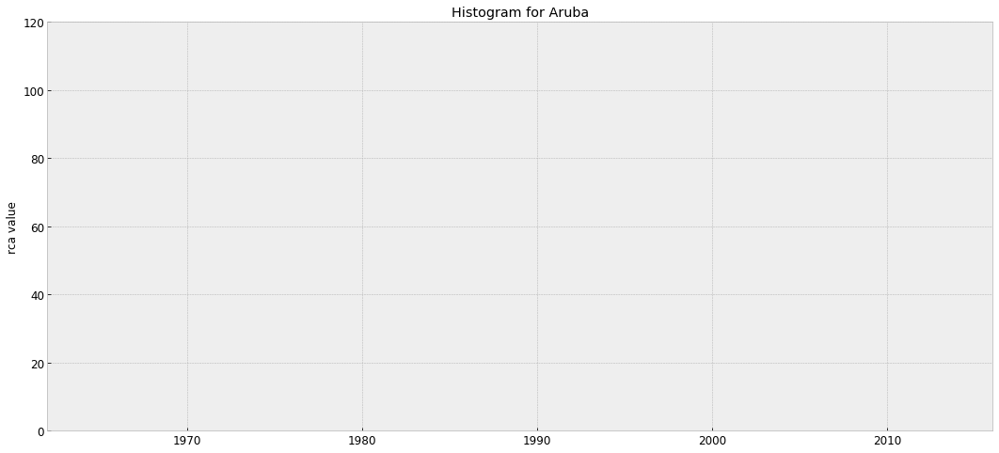

In [356]:
for exporter in exporters:
    root = save_images(df_grps,'rca_histograms')
    plt.figure(1); 
    plt.subplot(111)
    plt.title('Histogram for {}'.format(exporter))
    #sns.distplot(df_grps[exporter].values().index.year)
    plt.hist(df_grps[exporter])
    plt.ylabel('rca value')
    plt.xlim(1962,2016)
    plt.ylim(0,120)
    
    plt.subplot(112)
    plt.title('Density plot for {}'.format(exporter))
    df_grps[exporter].plot(kind='kde')
    plt.ylabel('Density')
    
    
    display(plt.savefig(str(root)))
    plt.show()

<div class="alert alert-block alert-info">

__Box and Whisker Plots:__ 

No high resolution in dataset to check:
 - what time series have similar median values across different years
 - whether there is a steady increase in the spread, or middle 50% of the data (boxes) over time
 - best model if considering seasonality
</div>

In [276]:
df_grps.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 56 entries, 1962-01-01 to 2017-01-01
Columns: 235 entries, Afghanistan to Zimbabwe
dtypes: float64(235)
memory usage: 103.2 KB


TypeError: unsupported operand type(s) for +: 'Timestamp' and 'str'

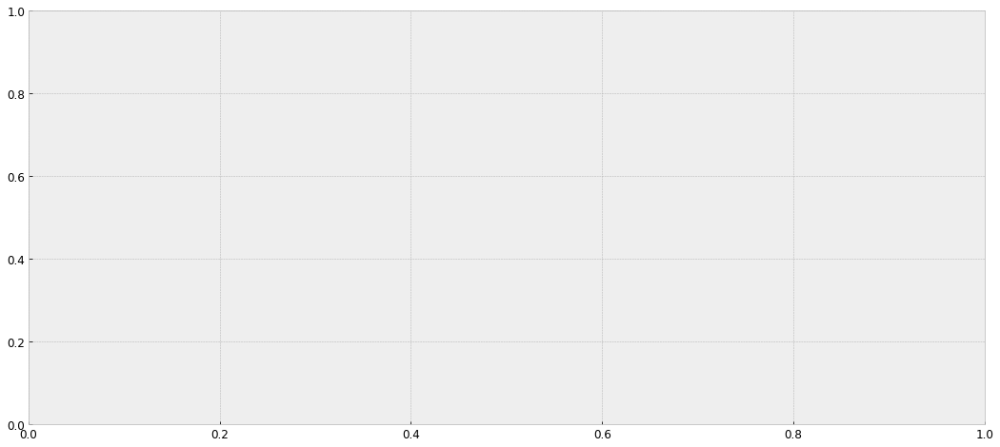

In [366]:
#plt.subplots(figsize=(15,6))
sns.distplot(xdf)
#savefile = os.path.join(path,'global trend')
#plt.savefig(savefile)
plt.show()

In [59]:
countries = df_grps.columns

**Target folder to store individual images**

In [197]:
def save_images(ts_groups,analysis):
    '''
    args: can be from these options ['decompose',acf_pacf','adf_test','rolling_stats']
    '''
    path = os.getcwd()+'\\images\\{}\\{}\\{}'.format(product,experiment,analysis)
    savefile = os.path.join(path, ts_groups[country].name)
    return savefile

__Decomposing using statsmodel:__
- We can use statsmodels to perform a decomposition of this time series. 
- The decomposition of time series is a statistical task that deconstructs a time series into several components, each representing one of the underlying categories of patterns. 
- With statsmodels we will be able to see the trend, seasonal, and residual components of our data.

**Decomposition**

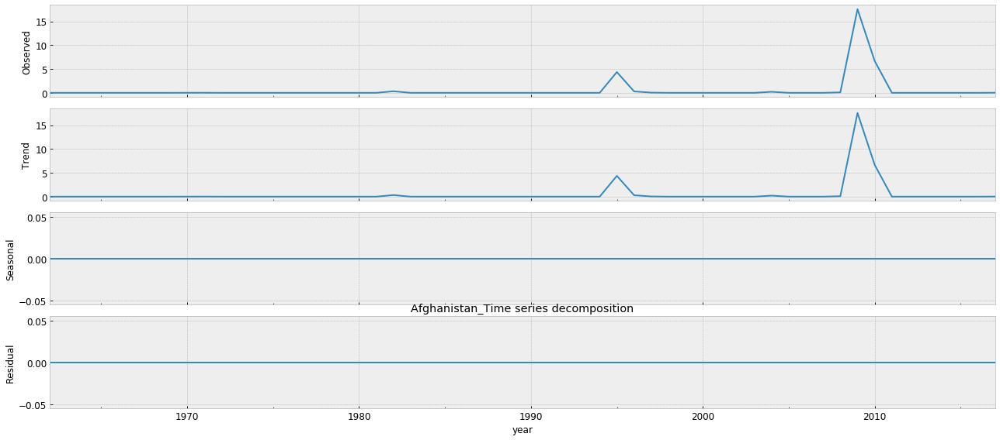

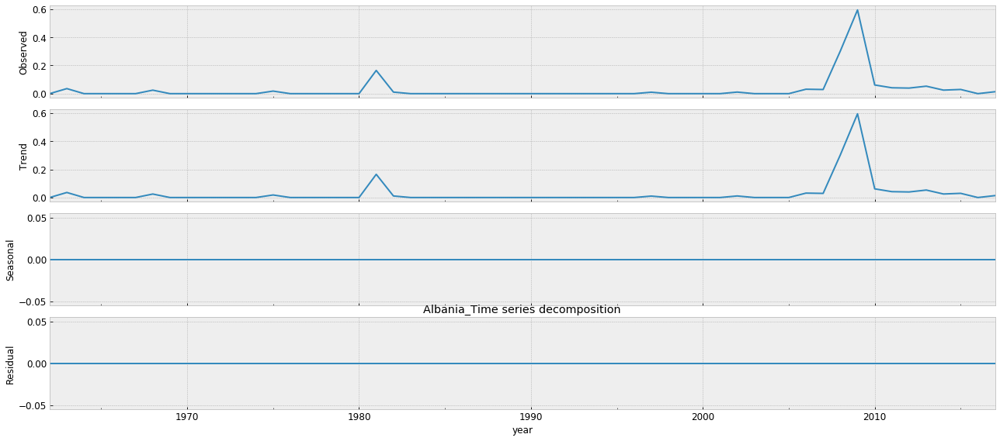

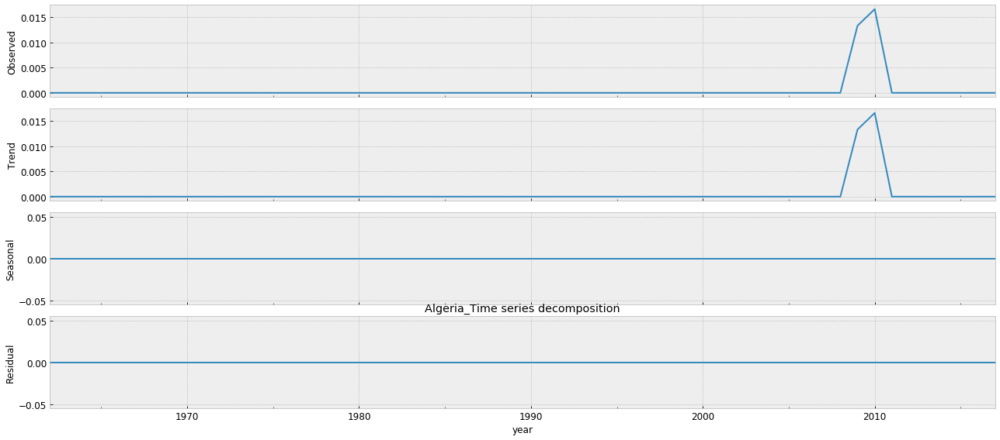

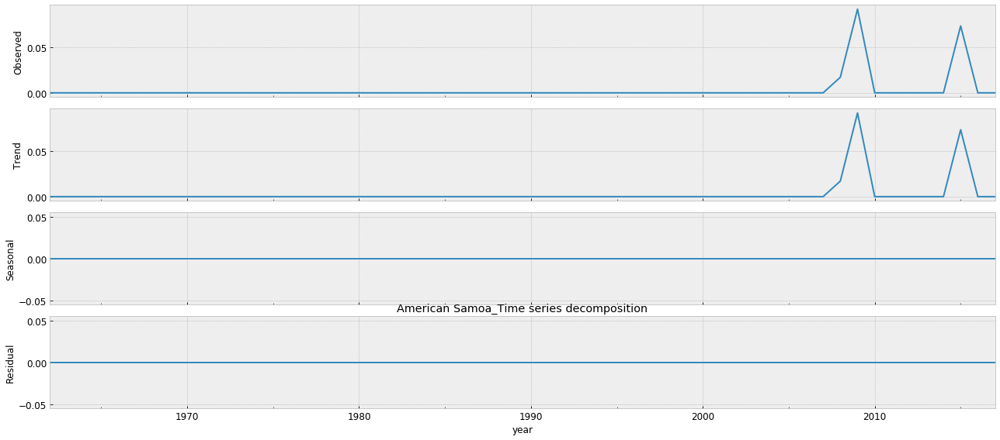

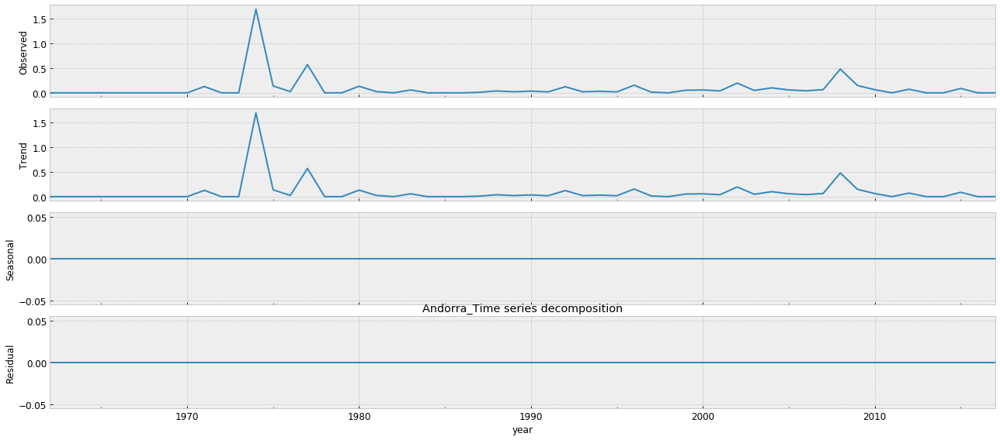

...

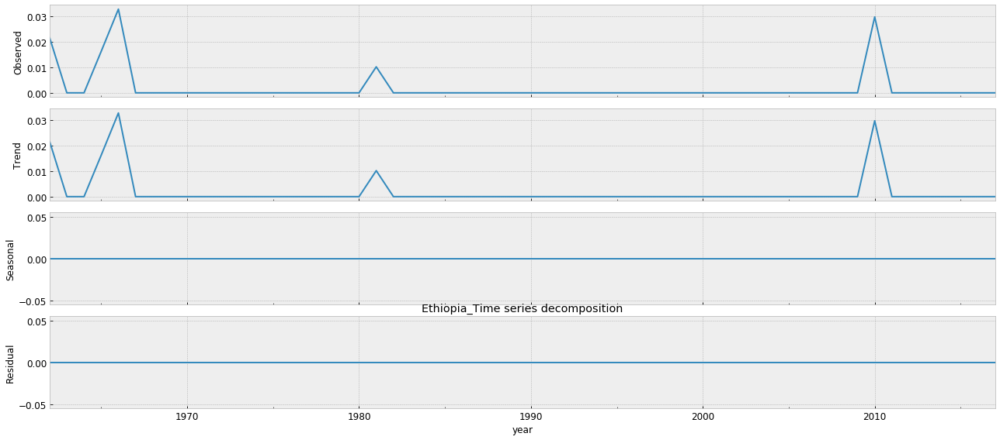

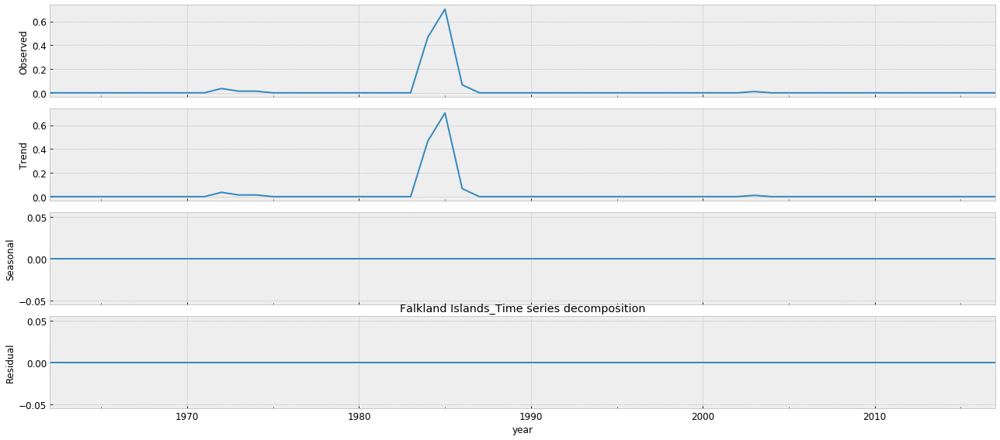

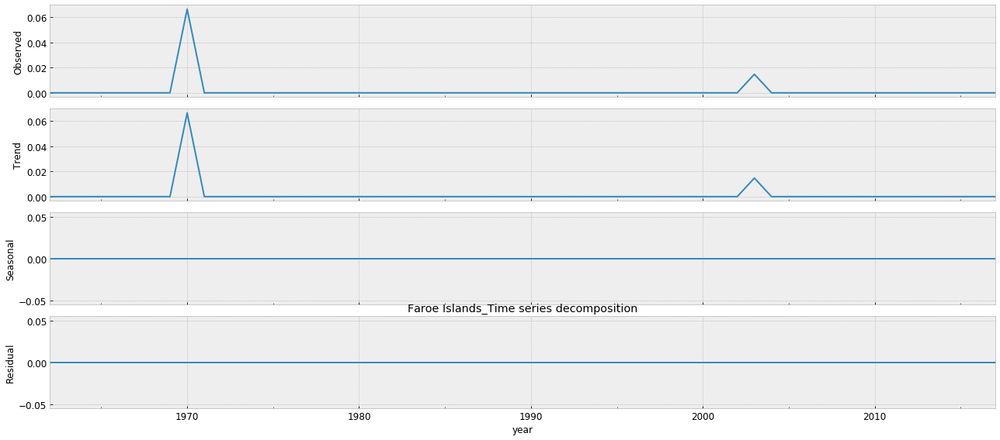

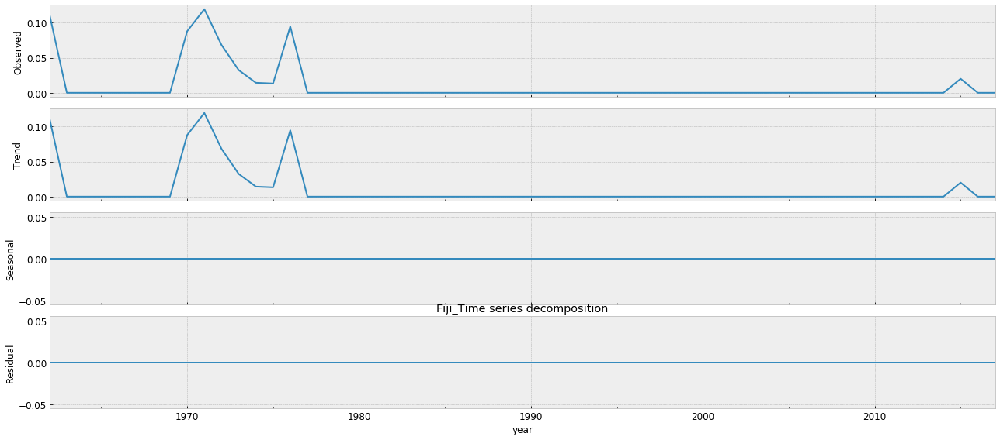

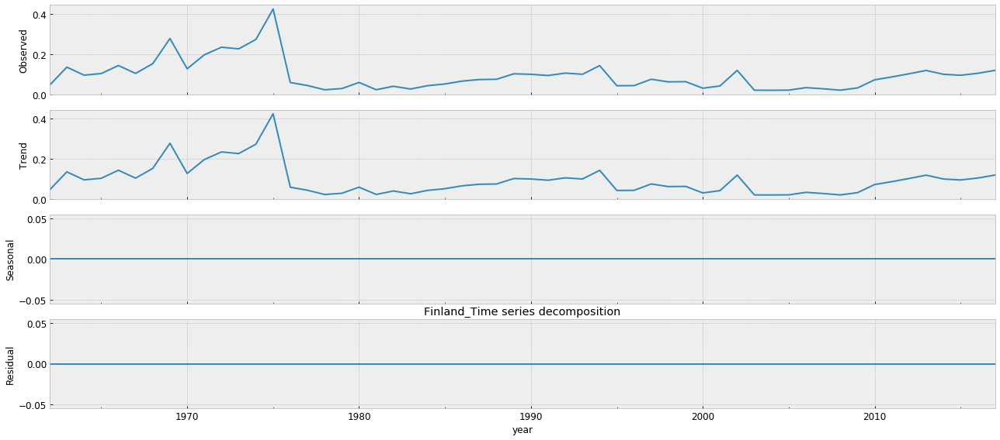

ValueError: Format ' yemen_decomposition' is not supported (supported formats: eps, jpeg, jpg, pdf, pgf, png, ps, raw, rgba, svg, svgz, tif, tiff)

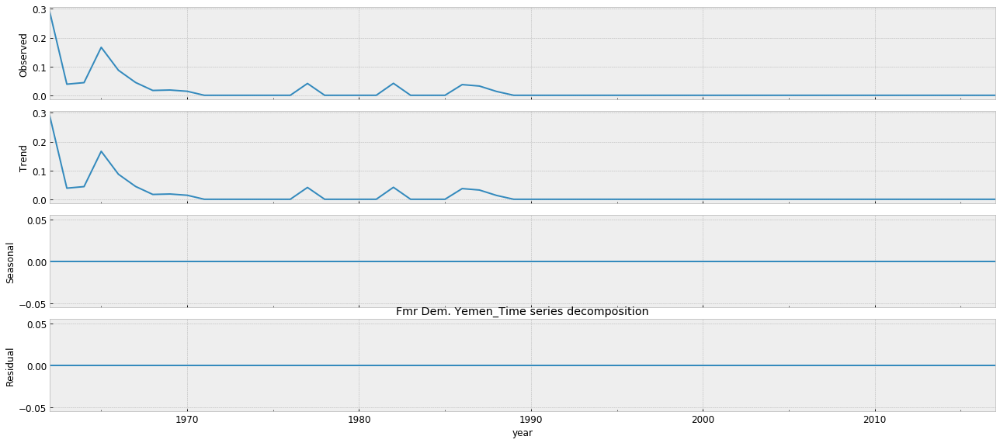

In [203]:
for country in countries:
    analysis = 'decomposition'
    savefile = save_images(df_grps,analysis)
    decomposition = sm.tsa.seasonal_decompose(df_grps[country], model='additive')
    rcParams['figure.figsize'] = 18, 8
    fig = decomposition.plot()
    
    plt.title('{}_Time series decomposition'.format(df_grps[country].name))
    plt.savefig(str('{}_{}'.format(savefile,analysis)))
    plt.show()

## Stationarity
- Most of the Time Series models work on the assumption that the TS is stationary. 
- Major reason for this is that there are many ways in which a series can be non-stationary, but only one way for stationarity.
- Intuitively, we can say that if a Time Series has a particular behaviour over time, there is a very high probability that it will follow the same behaviour in the future. 
- Also, the theories related to stationary series are more mature and easier to implement as compared to non-stationary series.

__Notes from__ [Alkaline ML](https://www.alkaline-ml.com/pmdarima/tips_and_tricks.html)

- tests of stationarity for testing a null hypothesis that an observable univariate time series is stationary around a deterministic trend (i.e. trend-stationary).
- A time series is __stationary when its mean, variance and auto-correlation, etc., are constant over time__. 
- Many time-series methods may perform better when a time-series is stationary, since forecasting values becomes a far easier task for a stationary time series (high probability of behaving the same way)
- ARIMAs that include differencing (i.e., d > 0) assume that the data becomes stationary after differencing. 
- This is called __difference-stationary__
- Auto-correlation plots are an easy way to determine whether your time series is sufficiently stationary for modeling. 
- If the plot does not appear relatively stationary, your model will likely need a differencing term. 
- These can be determined by using an Augmented Dickey-Fuller test, or various other statistical testing methods. 
- Note that auto_arima will automatically determine the appropriate differencing term for you by default.

In order to quantitatively determine whether we need to difference our data in order to make it stationary, we can conduct a test of stationarity

__We can check stationarity using the following:__

1. __ACF and PACF plots__:
    - If the time series is stationary, the ACF/PACF plots will show a __quick drop-off in correlation__ after a small amount of lag between points.
2. __Plotting Rolling Statistics__: 
    - We can plot the moving average or moving variance and see if it varies with time. 
    - __Moving average/variance__ is for any instant ‘t’, the average/variance of the last period (e.g year or last 12 months)
3. __Augmented Dickey-Fuller Test [*]:__
    - This is one of the statistical tests for checking stationarity.
    - Here the __null hypothesis is that the TS is non-stationary__.
     - The null hypothesis of the Augmented Dickey-Fuller is that there is a unit root, with the alternative that there is no unit root. 
     - If the pvalue is above a critical size, then we cannot reject that there is a unit root.
     - The p-values are obtained through regression surface approximation from MacKinnon 1994, but using the updated 2010 tables
     - If the p-value is close to significant, then the critical values should be used to judge whether to reject the null.
     - The autolag option and maxlag for it are described in Greene
    - The test results comprise of a Test Statistic and some Critical Values for difference confidence levels. 
    - If the ‘Test Statistic’ is less than the ‘Critical Value’, we can reject the null hypothesis and say that the series is stationary.  **Based on papers by**:
    
    .. [*] W. Green.  "Econometric Analysis," 5th ed., Pearson, 2003.
    
    .. [*] Hamilton, J.D.  "Time Series Analysis".  Princeton, 1994.
    
    .. [*] MacKinnon, J.G. 1994.  "Approximate asymptotic distribution functions for
    unit-root and cointegration tests.  `Journal of Business and Economic Statistics` 12, 167-76.
    
    .. [*] MacKinnon, J.G. 2010. "Critical Values for Cointegration Tests."  Queen's
    University, Dept of Economics, Working Papers.  Available at
    http://ideas.repec.org/p/qed/wpaper/1227.html

### ACF and PACF plots

- Let's review the Autocorrelation Function (ACF) and Partial Autocorrelation Function (PACF) plots
- If the time series is stationary, the ACF/PACF plots will show a __quick drop-off in correlation__ after a small amount of lag between points.
- This data is non-stationary as a high number of previous observations are correlated with future values.
- Confidence intervals are drawn as a cone. 
- By default, this is set to a 95% confidence interval, suggesting that correlation values outside of this code are very likely a correlation and not a statistical fluke.
- The partial autocorrelation at lag k is the correlation that results after removing the effect of any correlations due to the terms at shorter lags.

In [ ]:
for country in countries:
    savefile = save_images(df_grps,'acf_pacf')
    
    plt.figure(figsize=(15,6))
    plt.subplot(121)
    plot_acf(df_grps[country], ax=pyplot.gca(),title="{} - Autocorrelation".format(df_grps[country].name))
    
    plt.subplot(122); 
    plot_pacf(df_grps[country], ax=pyplot.gca(),title="{} - Partial Autocorrelation".format(df_grps[country].name))
    
    plt.savefig(str('{}_ACF_PACF'.format(savefile)))
    plt.show()

## Interpreting ACF plots


ACF Shape	| Indicated Model |
-- | -- |
Exponential, decaying to zero |	Autoregressive model. Use the partial autocorrelation plot to identify the order of the autoregressive model |
Alternating positive and negative, decaying to zero	Autoregressive model. |  Use the partial autocorrelation plot to help identify the order. |
One or more spikes, rest are essentially zero | Moving average model, order identified by where plot becomes zero. |
Decay, starting after a few lags |	Mixed autoregressive and moving average (ARMA) model. | 
All zero or close to zero | Data are essentially random. |
High values at fixed intervals | Include seasonal autoregressive term. |
No decay to zero |	Series is not stationary |

### Plotting Rolling Statistics
- We observe that the rolling mean and Standard deviation are not constant with respect to time (increasing trend)
- The time series is hence not stationary

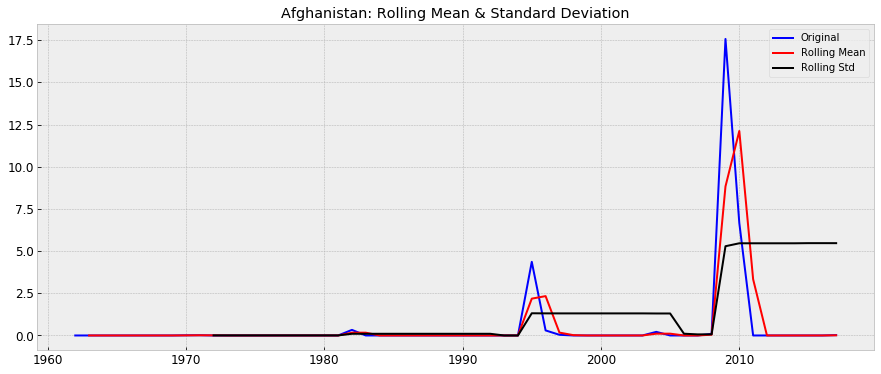

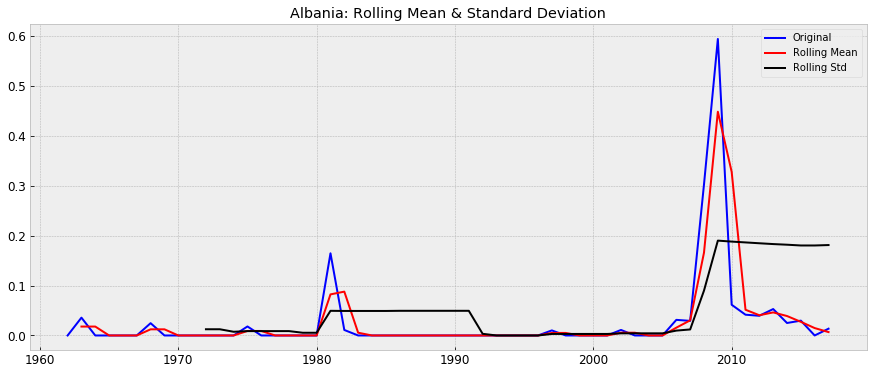

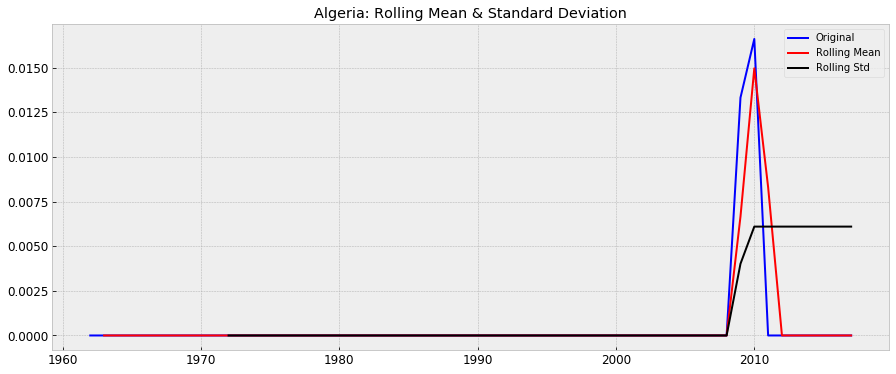

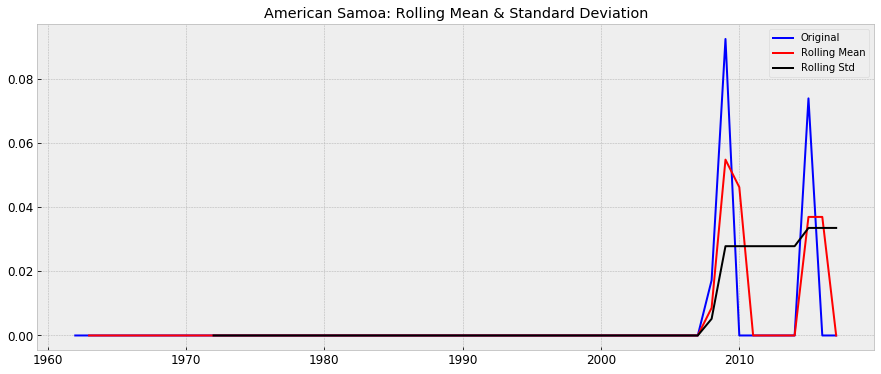

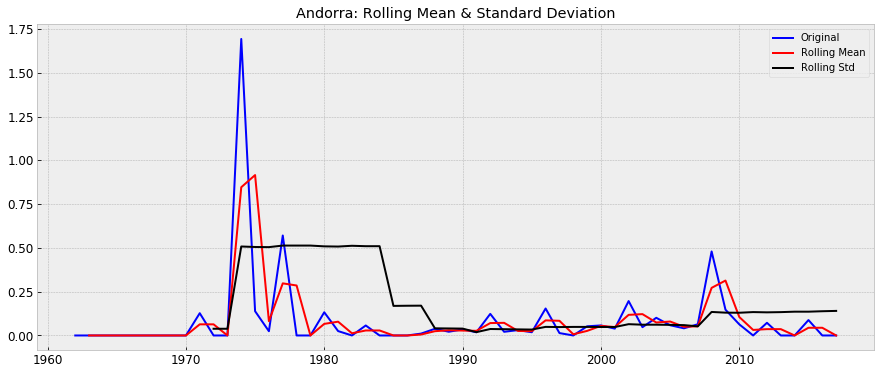

...

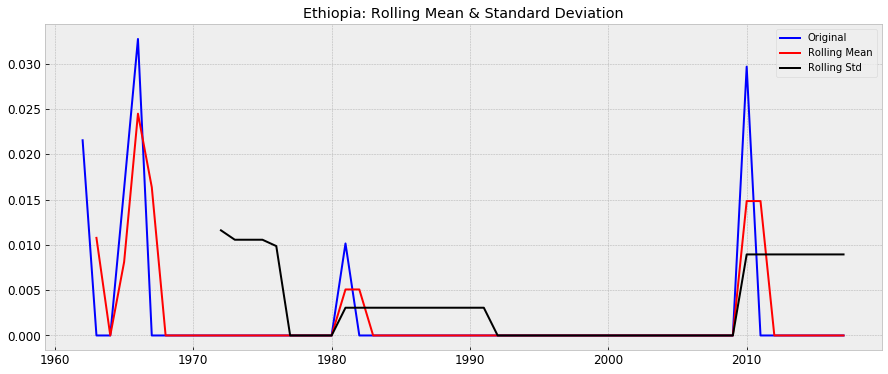

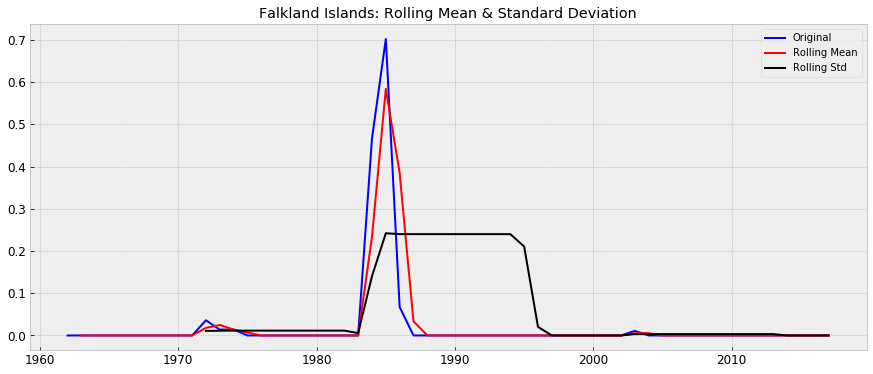

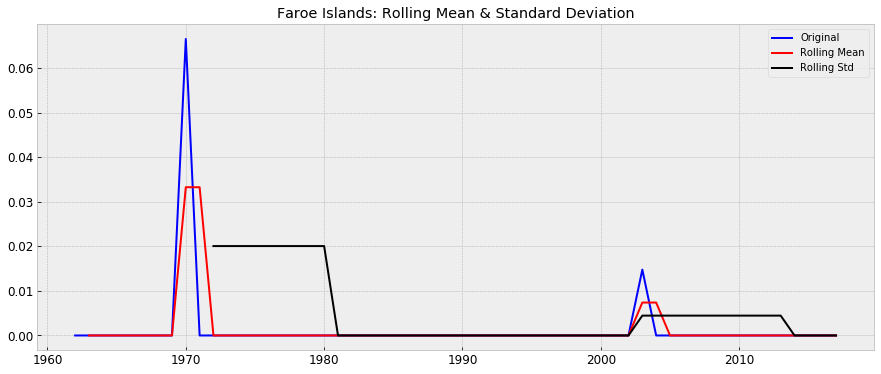

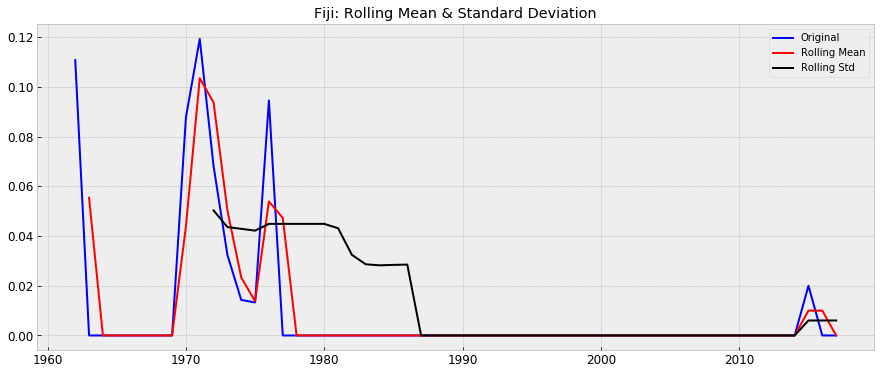

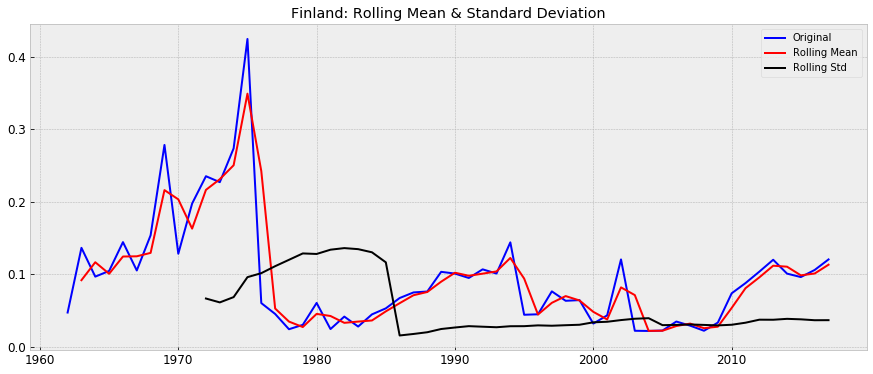

ValueError: Format ' yemen_rolling_stats' is not supported (supported formats: eps, jpeg, jpg, pdf, pgf, png, ps, raw, rgba, svg, svgz, tif, tiff)

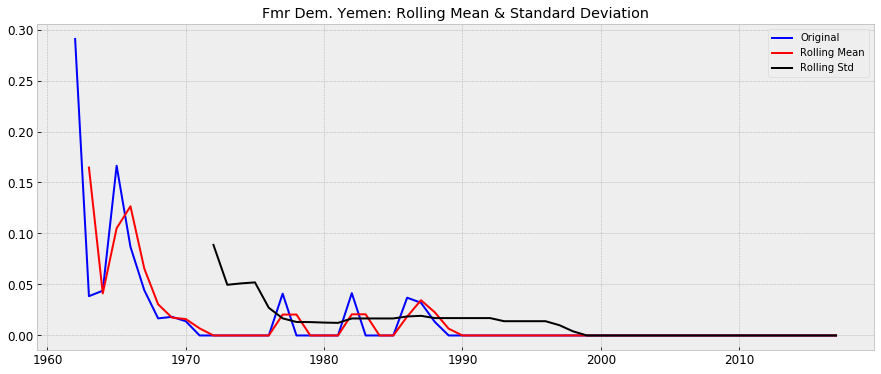

In [64]:
cycles = int((len(df_grps))/5)

for country in countries:
    savefile = save_images(df_grps,'rolling_stats')
    
    plt.figure(figsize=(15,6))

    rolmean = df_grps[country].rolling(2).mean()
    rolstd = df_grps[country].rolling(cycles).std()
        
    #Plot rolling statistics:
    orig = plt.plot(df_grps[country], color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    
    plt.legend(loc='best')
    plt.title('{}: Rolling Mean & Standard Deviation'.format(df_grps[country].name))
    plt.savefig(str('{}_Rolling_Stats'.format(savefile)))
    plt.show(block=False)

### Augmented Dickey-Fuller  (ADF) Test
- The intuition behind the test is that if the series is integrated then the lagged level of the series y(t-1)  will provide no relevant information in predicting the change in y(t).

**Null hypothesis (Ho)**: The time series is not stationary, it presents heterocedasticity. In other words, the time series depends on itself (i.e.: yt depends on yt-1, yt-1 depends on yt-2
- Rejecting the null hypothesis (i.e. a very low p-value) will indicate stationarity. Put simply, the t-test result is less than all critical values (1%,5%,10%)

**Alternative hypothesis(Ha)**: the series is stationary

[ADF results description](https://www.statsmodels.org/dev/generated/statsmodels.tsa.stattools.adfuller.html#statsmodels.tsa.stattools.adfuller)

In [85]:
from statsmodels.tsa.stattools import adfuller, kpss

In [86]:
def ADF_Stationarity_Test(ts_groups):
    
    #countries = list(ts_groups.columns)
    adf_results = {}
    col_names=['Test Statistic','p_value','Lags used','Observations Used','1% Critical value','5% Critical value','10% Critical value','IC_Best']
    data = pd.DataFrame(columns=col_names,index=countries)

    for country in countries:
        #Dickey-Fuller test
        adf_results[country] = tsa.adfuller(ts_groups[country],autolag='AIC')
        
    for country in adf_results:
        data.loc[country] = pd.Series({'Test Statistic':adf_results[country][0],
                                       'p_value':adf_results[country][1],
                                       'Lags used':adf_results[country][2],
                                       'Observations Used':adf_results[country][3],
                                       '1% Critical value': adf_results[country][4]['1%'],
                                       '5% Critical value': adf_results[country][4]['5%'],
                                       '10% Critical value': adf_results[country][4]['10%'],
                                       'IC_Best': adf_results[country][5]
                                      })
    return data.transpose()
    

In [87]:
adf_test = ADF_Stationarity_Test(df_grps)
adf_countries = adf_test.columns

In [88]:
adf_test['South Africa'].name

'South Africa'

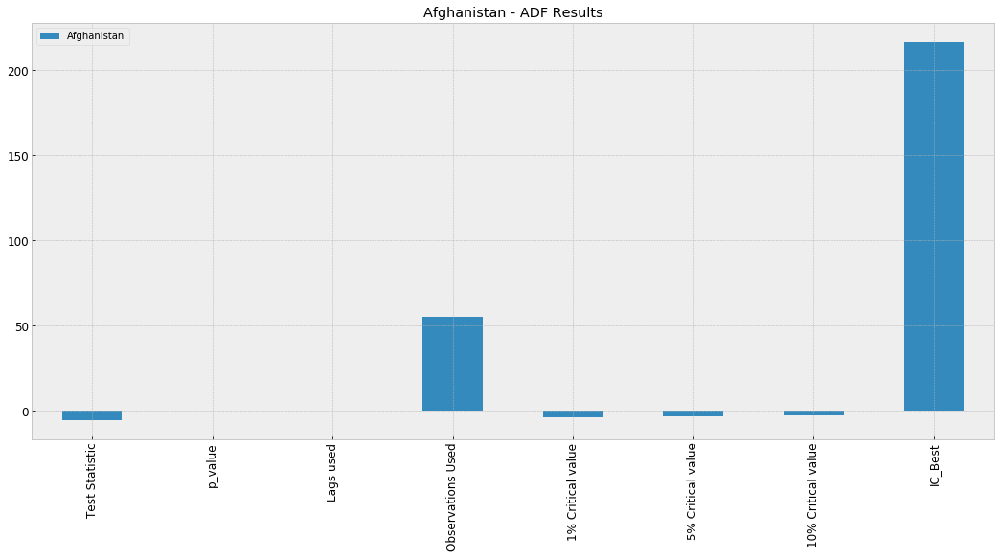

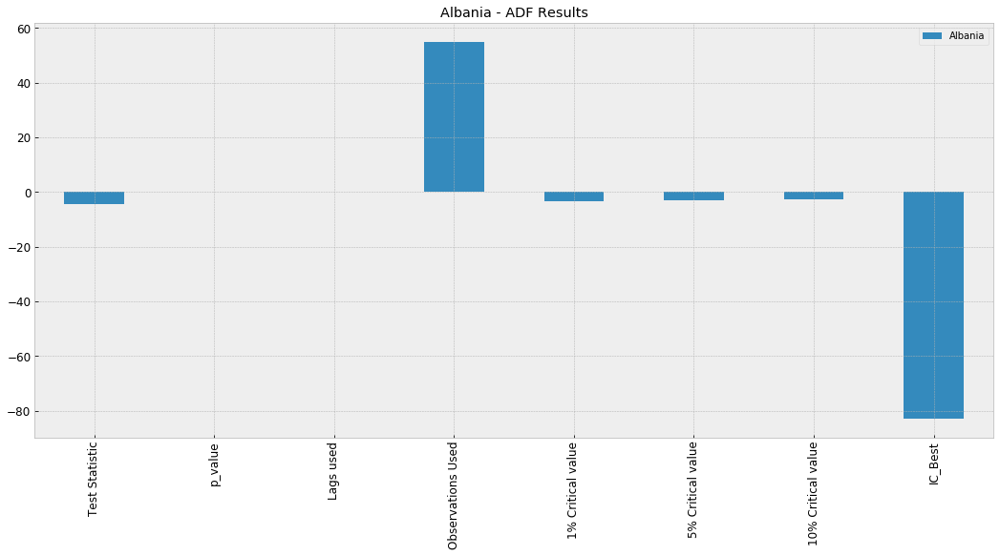

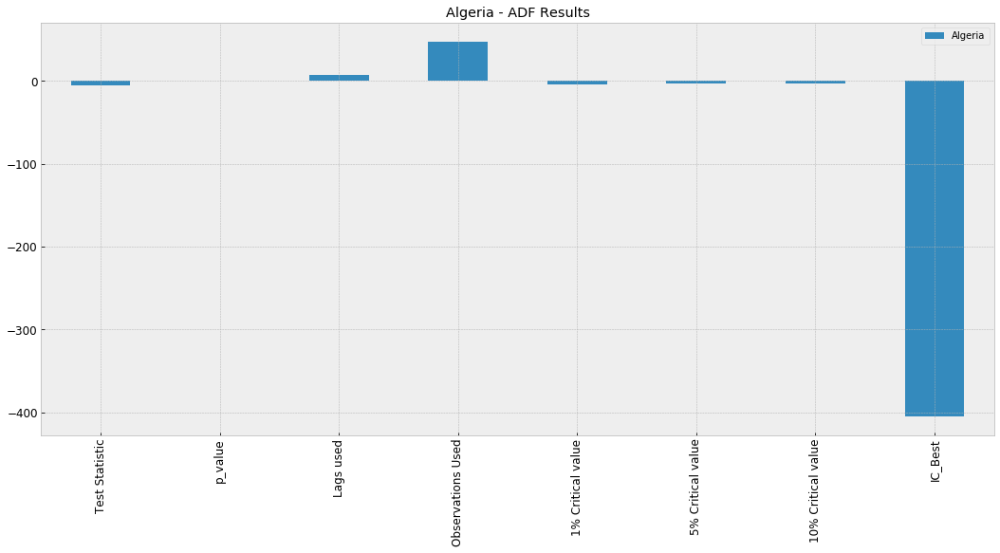

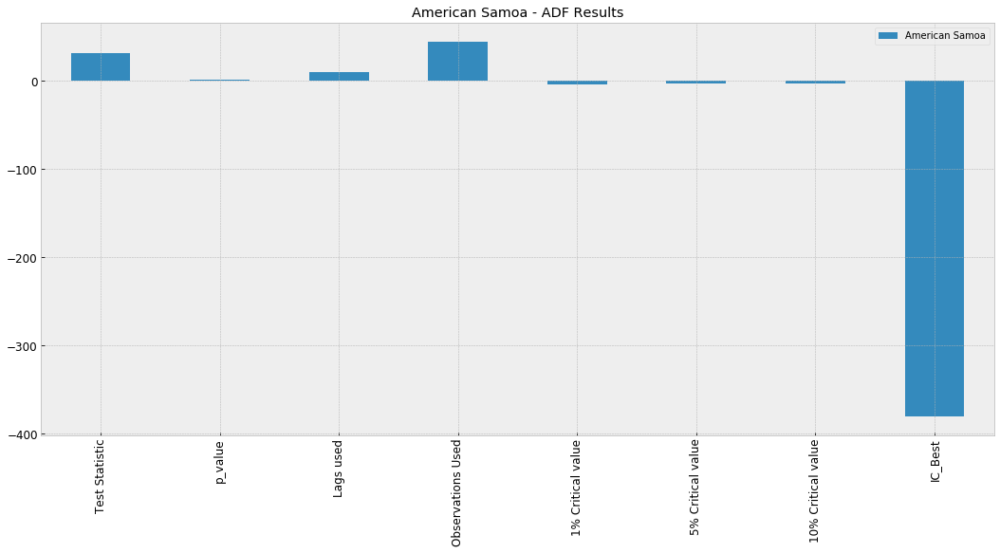

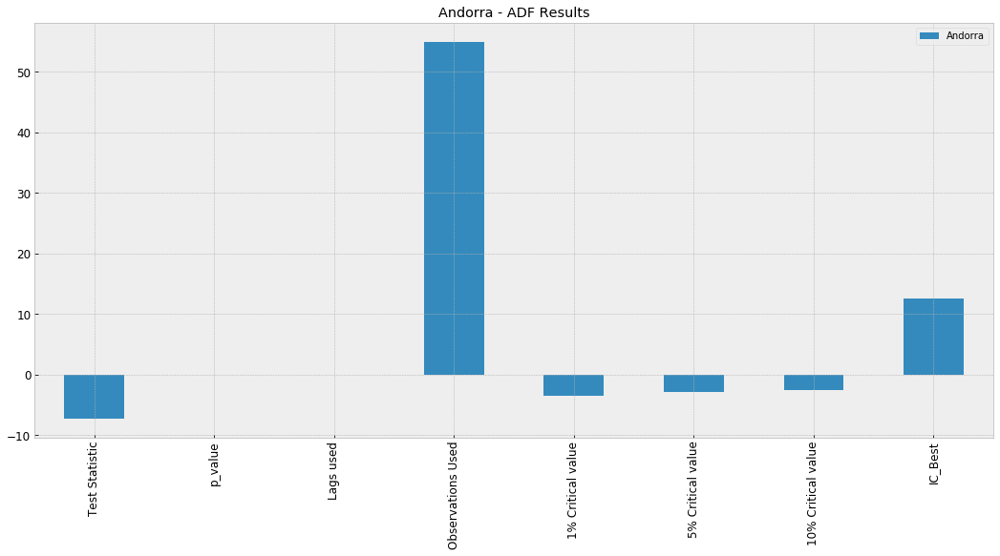

...

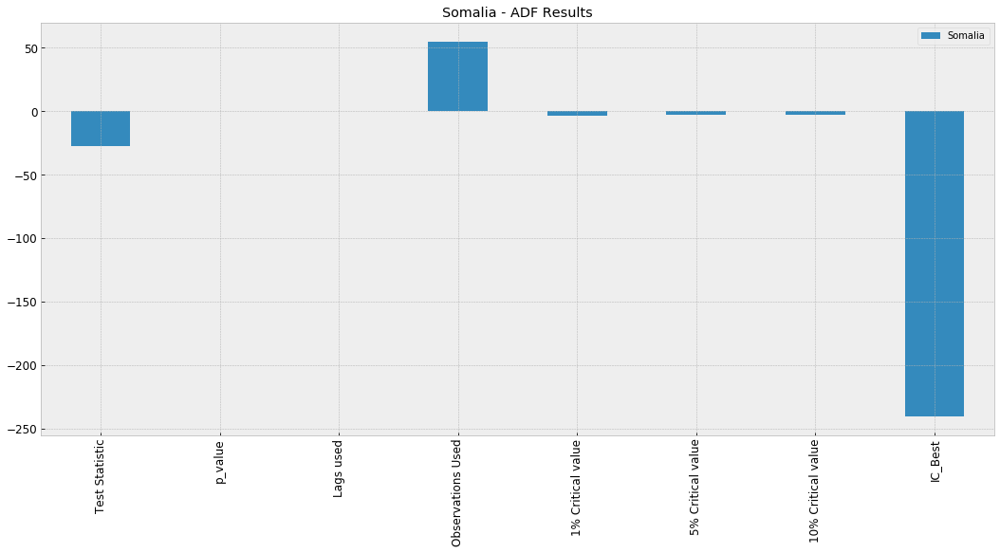

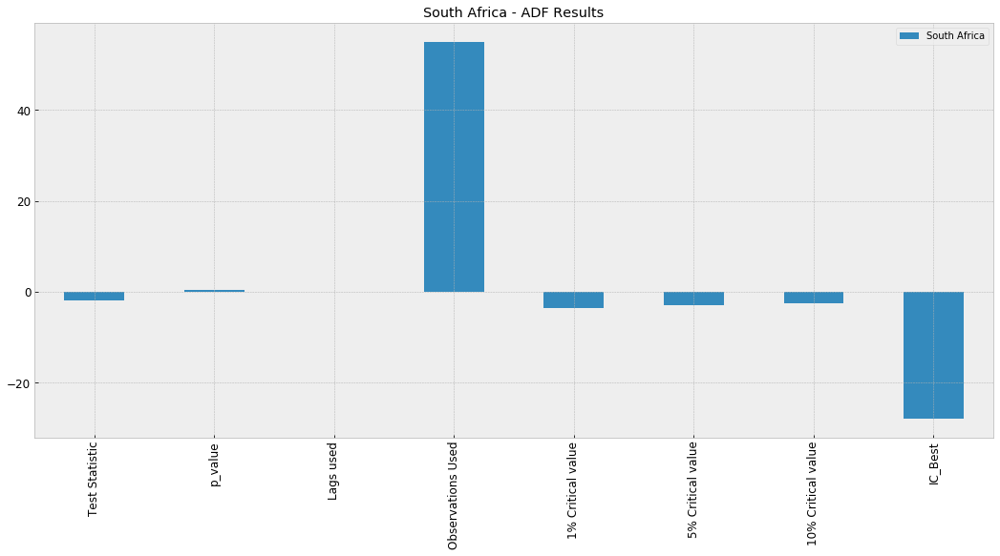

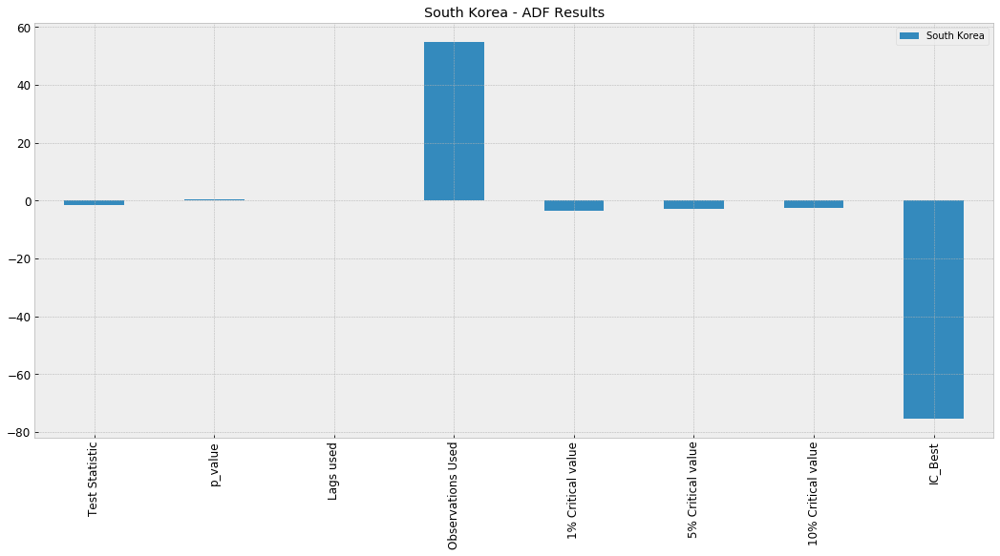

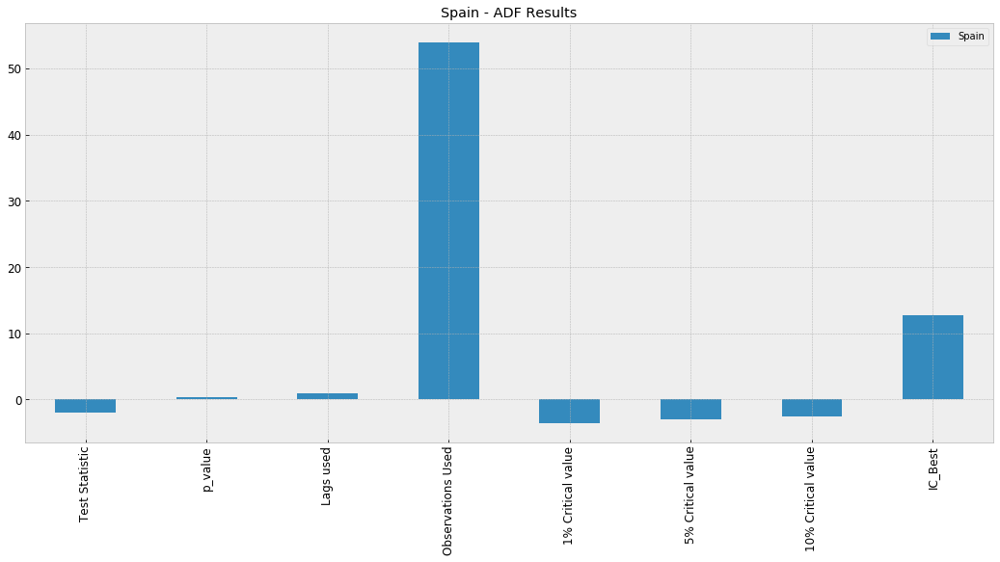

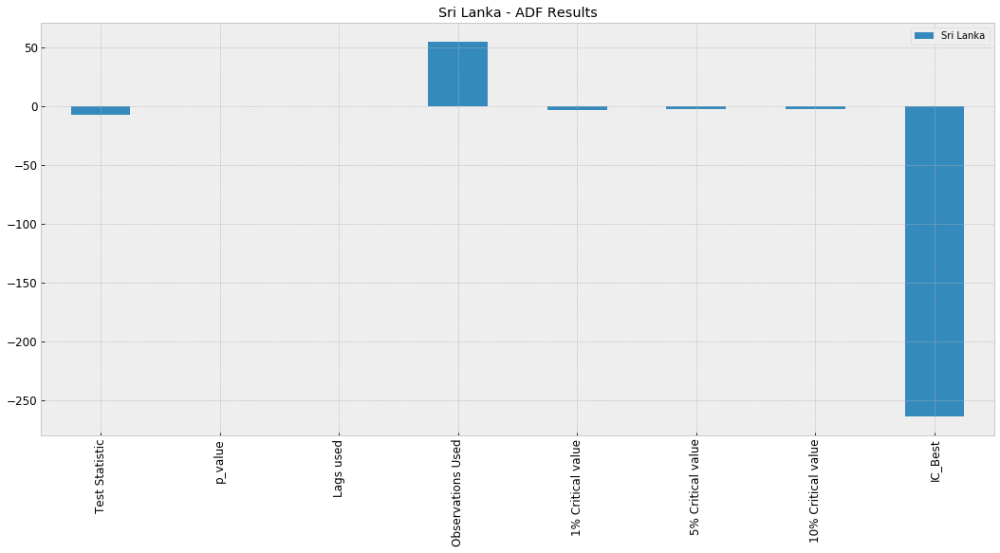

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\16353\\Documents\\ThaW\\PhD\\time_series_trade\\images\\engine_parts\\rca_tests\\adf_test\\St-Martin / St Maarten_ADF.png'

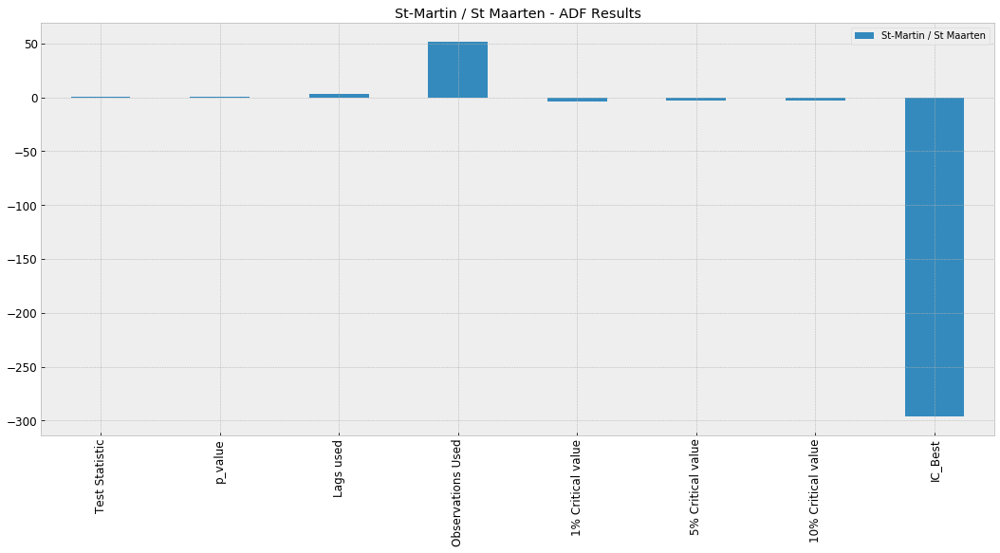

In [117]:
for country in adf_test:
    savefile = save_images(adf_test,'adf_test')
    adf_test[country].plot.bar()
    plt.legend(loc='best')
    plt.title('{} - ADF Results'.format(adf_test[country].name))
    plt.savefig(str('{}_ADF.png'.format(savefile)))
    plt.show()
    
    
    #pyplot.figure(figsize=(15,6))

    #Plot rolling statistics:
    #adf_plot = plt.plot(adf_test[country])
    
    #plt.legend(loc='best')
    #plt.title('{}: ADF'.format(adf_test[country].name))
    #pyplot.savefig(str('{}adf_test.png'.format(savefile)))
    #pyplot.show(block=False)

Automattion: [Try this to automate p-value rejection for non-stationary time series](http://www.insightsbot.com/blog/1MH61d/augmented-dickey-fuller-test-in-python)

## Making Time Series Stationary
There are 2 major reasons behind non-stationaruty of a TS:

1. __Trend__ – varying mean over time. For eg, in this case we saw that on average, the number of passengers was growing over time.
2. __Seasonality__ – variations at specific time-frames. eg people might have a tendency to buy cars in a particular month because of pay increment or festivals.

[Other sources to check](https://www.analyticsvidhya.com/blog/2016/02/time-series-forecasting-codes-python/)

### Transformations
- We can apply transformation which penalize higher values more than smaller values
- These can be taking a log, square root, cube root

#### Log Scale Transformation

### Techniques to remove Trend - Smoothing
- Smoothing is taking rolling averages over windows of time

In [ ]:
ts_log = np.log(df_grps)
plt.plot(ts_log)
plt.show()

In [ ]:
ts_log

#### Moving Average
- We take average of ‘k’ consecutive values depending on the frequency of time series. 
- Here we can take the average over the past 1 year, i.e. last 12 values. 
- A drawback in this particular approach is that the time-period has to be strictly defined. 

In [ ]:
moving_avg = ts_log.rolling(5).mean()
plt.plot(ts_log)
plt.plot(moving_avg)
plt.show()

In [ ]:
ma = []
for col in ts_log:
    ts_log_moving_avg_diff = ts_log[col] - moving_avg[col]
    #ma.append(ts_log_moving_avg_diff)
ts_log_moving_avg_diff.head(10)

In [ ]:
ts_log_moving_avg_diff.dropna(inplace=True)
test_stationarity(ts_log_moving_avg_diff)

#### Exponentially weighted moving average:
- To overcome the problem of choosing a defined window in moving average, we can use exponential weighted moving average
- We take a ‘weighted moving average’ where more recent values are given a higher weight. 
- There can be many technique for assigning weights. A popular one is exponentially weighted moving average where weights are assigned to all the previous values with a decay factor. 

In [ ]:
expwighted_avg = ts_log.ewm(com=0.5).mean()
#df.ewm(com=0.5).mean()
plt.plot(ts_log)
plt.plot(expwighted_avg)
plt.show()

In [ ]:
ts_log_ewma_diff = ts_log- expwighted_avg
ts_log_ewma_diff

### Further Techniques to remove Seasonality and Trend
- The simple trend reduction techniques discussed before don’t work in all cases, particularly the ones with high seasonality. 

#### Differencing
- In this technique, we take the difference of the observation at a particular instant with that at the previous instant. 
- First order differencing in Pandas

In [ ]:
ts_log_diff = ts_log - ts_log.shift()
plt.plot(ts_log_diff)
plt.show()

In [ ]:
ts_log_diff.dropna(inplace=True)
test_stationarity(ts_log_diff)

#### Decomposition
- In this approach, both trend and seasonality are modeled separately and the remaining part of the series is returned.

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
decomposition = seasonal_decompose(ts_log)

trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

plt.subplot(411)
plt.plot(ts_log, label='Original')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(trend, label='Trend')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(seasonal,label='Seasonality')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(residual, label='Residuals')
plt.legend(loc='best')
plt.tight_layout()

In [ ]:
ts_log_decompose = residual
ts_log_decompose.dropna(inplace=True)
test_stationarity(ts_log_decompose)